<h1 align=center><font size = 6>Classify Cat and Dog Images with VGG-16</font></h1>

<img src="https://d.newsweek.com/en/full/1809693/cat-dog.jpg?w=1600&h=900&q=88&f=772f894f001bafc6c5094cc33d71bc19" width=1000 height=450 alt="https://d.newsweek.com/"/>

<small>Picture Source: <a href="https://www.newsweek.com/cat-becomes-dog-copying-behavior-adorable-video-1595916">Newsweek</a></small>

<br>

<h2>Objective</h2>

<p>The objective of this project is to develop a deep learning model using the VGG16 architecture to classify images of cats and dogs with high accuracy. The model will be trained on a dataset of labeled images and evaluated on a separate test set. The performance of the model will be measured using metrics such as accuracy, precision, recall, and F1 score. The ultimate goal is to create a model that can accurately distinguish between images of cats and dogs in real-world scenarios.</p>

<br>

<h2>Context</h2>

<p>The dataset consists of 1,425 digital images of domestic animals, specifically 713 images of dogs and 712 images of cats. These images were collected for the purpose of training a deep learning model to classify images of cats and dogs with high accuracy. All images were obtained from various online sources and manually labeled by experts to ensure accuracy of the dataset. The images vary in size and resolution, and were preprocessed to remove any artifacts or unwanted information. </p>

<br><a href=''></a>

<h2>Table of Contents</h2>

<div class="alert alert-block alert-info" style="margin-top: 20px">
  <ul>
    <li><a href="https://#appropriate_environment">Create the Appropriate Environment</a></li>
    <li><a href="https://#libraries">Import Libraries and Packages </a></li>
    <li><a href="https://#data_preparation">Dataset Preparation</a></li>
    <li><a href="https://#compile_fit">Compile VGG-16 Model</a></li>
    <li><a href="https://#train_model">Train the VGG16 Model</a></li>
    <li><a href="https://#evaluate_model">Evaluate the VGG16 Model</a></li>
    <li><a href="https://#upload_pred">Upload and Predict Your Picture!</a></li>
  </ul>

  <br>

  <p>Estimated Time Needed: <strong>60 min</strong></p>

</div>

<br>

<h2 align=center id="appropriate_environment">Create the Appropriate Environment</h2>

<p>After downloading the dataset, we can create the appropriate environment for the data and we can unzip the file.</p>

In [1]:
!mkdir cat_dog_classification

In [2]:
%cd cat_dog_classification

/content/cat_dog_classification


In [3]:
!unzip -q /content/drive-download-20230504T091834Z-001.zip

In [11]:
import shutil
import os
import numpy as np

In [16]:
def train_test_split(val_ratio=0.1, test_ratio=0.2):

    print("Splitting started!")

    root_dir = '/content/'
    classes_dir = ['cats', 'dogs']
    processed_dir = '/content/cat_dog_classification'

    for cls in classes_dir:

        print("\nClass Name " + cls)
        src = processed_dir +"//" + cls
        allFileNames = os.listdir(src)
        np.random.shuffle(allFileNames)
        train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames), [int(len(allFileNames) * (1 - (val_ratio + test_ratio))), int(len(allFileNames) * (1 - val_ratio)),])

        train_FileNames = [src + '//' + name for name in train_FileNames.tolist()]
        val_FileNames = [src + '//' + name for name in val_FileNames.tolist()]
        test_FileNames = [src + '//' + name for name in test_FileNames.tolist()]

        print('Total images: '+ str(len(allFileNames)))
        print('Training: '+ str(len(train_FileNames)))
        print('Validation: '+  str(len(val_FileNames)))
        print('Testing: '+ str(len(test_FileNames)))

        os.makedirs(root_dir + '/train//' + cls)
        os.makedirs(root_dir + '/val//' + cls)
        os.makedirs(root_dir + '/test//' + cls)

        for name in train_FileNames:
            shutil.copy(name, root_dir + '/train//' + cls)
        for name in val_FileNames:
            shutil.copy(name, root_dir + '/val//' + cls)
        for name in test_FileNames:
            shutil.copy(name, root_dir + '/test//' + cls)

    print("\nComplete!")

In [17]:
train_test_split()

Splitting started!

Class Name cats
Total images: 712
Training: 498
Validation: 142
Testing: 72

Class Name dogs
Total images: 713
Training: 499
Validation: 142
Testing: 72

Complete!


In [19]:
%cd ..

/content


In [20]:
!ls

cat_dog_classification			 sample_data  train
drive-download-20230504T091834Z-001.zip  test	      val


<p>You may want to remove zip file which contains our dataset.</p>

In [ ]:
# !rm -rf /content/drive-download-20230504T091834Z-001.zip

<br>

<h2 align=center id="libraries">Import Libraries and Packages</h2>

<p>Before we proceed, let's import the libraries and packages that we will need to complete the rest of this lab.</p>

In [122]:
import matplotlib.pyplot as plt
import pandas as pd
import datetime

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import TensorBoard, CSVLogger, ModelCheckpoint

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, GlobalAveragePooling2D
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.utils import load_img, img_to_array

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc

import warnings
warnings.filterwarnings("ignore")

In [22]:
tf.__version__

'2.12.0'

<br>

<h2 align=center id="data_preparation">Dataset Preparation</h2>

<br>
<h3>Define Parameters</h3>

In [25]:
#@markdown ---
#@markdown ### Enter number of classes:
num_classes = 1 #@param {type:"integer"}

image_resize = (224, 224)

#@markdown

#@markdown ### Enter number of epochs:
num_epochs = 8 #@param {type:"integer"}

#@markdown

#@markdown ### Enter batch sizes:
batch_size_training = 8 #@param {type:"integer"}
batch_size_validation = 4 #@param {type:"integer"}
batch_size_test = 2 #@param {type:"integer"}

#@markdown 

#@markdown ### Enter director paths:
train_path = '/content/train' #@param {type:"string"}
valid_path = '/content/val' #@param {type:"string"}
test_path = '/content/test' #@param {type:"string"}
#@markdown ---

In [24]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

<p>We are going to separate our dataset as <i>1068</i> files for training and <i>355</i> files for validation.</p>

<br>
<h3>Prepare Train Class</h3>

In [29]:
train_generator = datagen.flow_from_directory(
    train_path,
    target_size=image_resize,
    batch_size=batch_size_training,
    class_mode='binary',
)

Found 996 images belonging to 2 classes.


In [30]:
print('Class indices:', train_generator.class_indices)
print('Number of train samples:', train_generator.samples)
print('First and last 5 filenames:', train_generator.filenames[0:5], train_generator.filenames[-5:])
# print('Train classes: ', train_generator.classes)

Class indices: {'cats': 0, 'dogs': 1}
Number of train samples: 996
First and last 5 filenames: ['cats/cat.4001.jpg', 'cats/cat.4003.jpg', 'cats/cat.4004.jpg', 'cats/cat.4005.jpg', 'cats/cat.4006.jpg'] ['dogs/dog.4698.jpg', 'dogs/dog.4700.jpg', 'dogs/dog.4701.jpg', 'dogs/dog.4702.jpg', 'dogs/dog.4703.jpg']


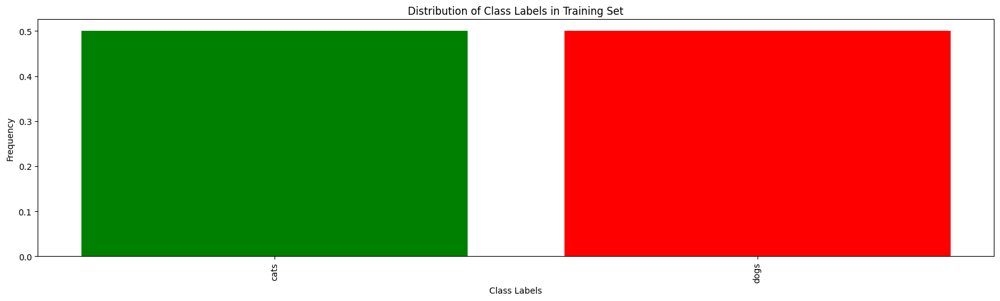

In [31]:
labels = list(train_generator.class_indices.keys())
freqs = np.mean(train_generator.labels, axis=0)

fig, ax = plt.subplots(figsize=(20, 5))
ax.bar(labels, freqs, color=['green', 'red'])
ax.set_xlabel('Class Labels')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Class Labels in Training Set')
plt.xticks(rotation=90)
plt.show()

<p>A balanced dataset is a dataset in which all classes or categories have approximately the same number of samples. This means that no class is overrepresented or underrepresented in the dataset. In other words, a balanced dataset has a uniform distribution of samples across all classes.</p>

<p>Having a balanced dataset is important for training machine learning models because it ensures that the model is exposed to an equal number of examples from all classes.</p>

In [32]:
labels = train_generator.classes
unique_labels, label_counts = np.unique(labels, return_counts=True)

print("Number of unique labels:", len(unique_labels))
for label, count in zip(unique_labels, label_counts):
    print("Label:", label, "- Count:", count)

Number of unique labels: 2
Label: 0 - Count: 497
Label: 1 - Count: 499


<br>
<h4>Dive Into Batches</h4>

<p>The batch size refers to the number of samples that will be processed by the model in each training iteration. For example, if the batch size is set to 32, then the model will process 32 samples at a time during each iteration. Larger batch sizes can lead to faster training times, but can also require more memory and may be less accurate. Smaller batch sizes can be slower, but may result in better generalization and less overfitting.</p>

In [33]:
first_batch = train_generator.next()

In [34]:
first_batch[1]

array([0., 0., 1., 1., 1., 0., 1., 0.], dtype=float32)

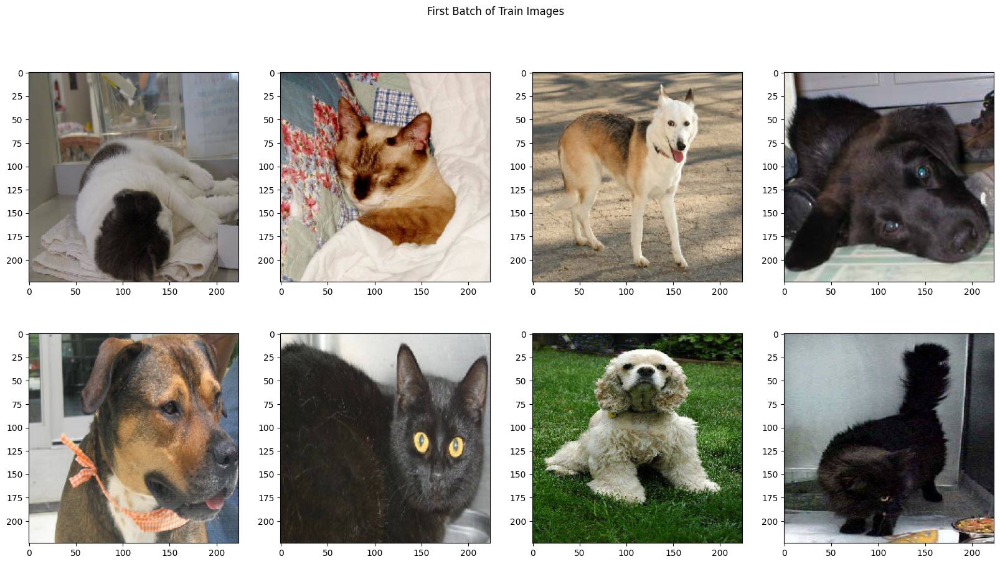

In [35]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))

ind = 0
for ax1 in axs:
    for ax2 in ax1: 
        image_data = first_batch[0][ind]
        ax2.imshow(image_data)
        ind += 1

fig.suptitle('First Batch of Train Images') 
plt.show()

<br>
<h3>Prepare Validation Class</h3>

In [36]:
validation_generator = datagen.flow_from_directory(
    valid_path,
    target_size=(224, 224),
    batch_size=batch_size_validation,
    class_mode='binary',
)

Found 283 images belonging to 2 classes.


In [37]:
print('Class indices:', validation_generator.class_indices)
print('Number of validation samples:', validation_generator.samples)
print('First and last 5 filenames:', validation_generator.filenames[0:5], validation_generator.filenames[-5:])
# print('Validation classes: ', validation_generator.classes)

Class indices: {'cats': 0, 'dogs': 1}
Number of validation samples: 283
First and last 5 filenames: ['cats/cat.4002.jpg', 'cats/cat.4014.jpg', 'cats/cat.4016.jpg', 'cats/cat.4027.jpg', 'cats/cat.4035.jpg'] ['dogs/dog.4674.jpg', 'dogs/dog.4684.jpg', 'dogs/dog.4694.jpg', 'dogs/dog.4697.jpg', 'dogs/dog.4699.jpg']


<br>

<p>The "Distribution of Class Labels in Training Set" plot shows the distribution of samples across the different classes or categories in the <i>training set</i>. The <i>x-axis</i> represents the different classes, and the y-axis represents the frequency or number of <i>samples</i> in each <i>class</i>. Each <i>bar</i> in the plot represents a class, and its height corresponds to the number of samples in that class.</p>

<br>

<p>By <i>examining</i> this <i>plot</i>, you can get a sense of how <i>balanced</i> or <i>imbalanced</i> your <i>dataset</i> is. If the height of the bars is roughly the same for all classes, then your <i>dataset</i> is considered to be balanced. If some bars are much taller than others, then your dataset is considered to be <i>imbalanced</i>, with some <i>classes</i> having more samples than others.</p>

<br>

<p>This plot is helpful for understanding the underlying distribution of your dataset and identifying any potential <i>imbalances</i> that may affect your model's performance. <b>If your <i>dataset</i> is <i>imbalanced</i>, you may need to consider using techniques such as <i>oversampling</i> or <i>undersampling</i> to create a more balanced dataset</b>.</p>

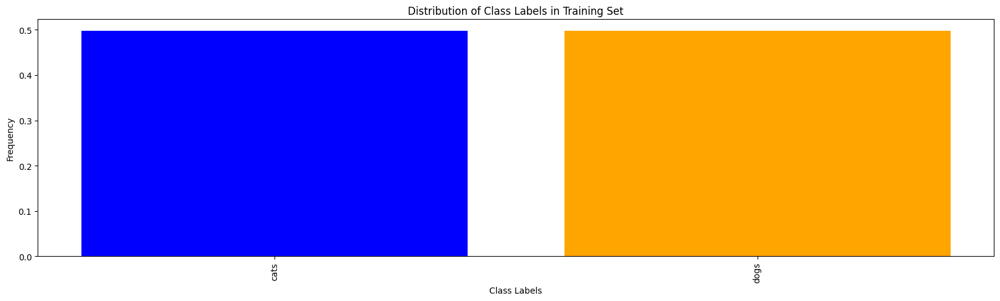

In [38]:
labels = list(validation_generator.class_indices.keys())
freqs = np.mean(validation_generator.labels, axis=0)

fig, ax = plt.subplots(figsize=(20, 5))
ax.bar(labels, freqs, color=['blue', 'orange'])
ax.set_xlabel('Class Labels')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Class Labels in Training Set')
plt.xticks(rotation=90)
plt.show()

In [39]:
labels = validation_generator.classes
unique_labels, label_counts = np.unique(labels, return_counts=True)

print("Number of unique labels:", len(unique_labels))
for label, count in zip(unique_labels, label_counts):
    print("Label:", label, "- Count:", count)

Number of unique labels: 2
Label: 0 - Count: 142
Label: 1 - Count: 141


<p>Having a <i>balanced dataset</i> is important for training <i>machine learning models</i> because it ensures that the model is exposed to an equal number of examples from all classes. This is particularly important in <i>classification problems</i>, where the goal is to <i>predict</i> the correct <i>class label</i> for a given input sample. If a <i>dataset</i> is imbalanced, where some classes have much fewer examples than others, the <i>model</i> may learn to be <i>biased</i> towards the <i>majority class</i> and perform poorly on the <i>minority classes</i>.</p>

<p><i>Balancing</i> a <i>dataset</i> can be achieved through various techniques, such as <b><i>oversampling the minority classes</i>, <i>undersampling the majority classes</i>, or using a <i>combination</i> of both</b>. These techniques aim to <i>adjust</i> the number of samples in each class to create a more <i>balanced dataset</i>.</p>

<br>
<h4>Dive Into Batches</h4>

<p>The <i>batch</i> size determines the number of <i>samples</i> processed in each <i>iteration</i>.</p>

In [40]:
first_batch = validation_generator.next()

In [41]:
first_batch[1]

array([0., 0., 0., 0.], dtype=float32)

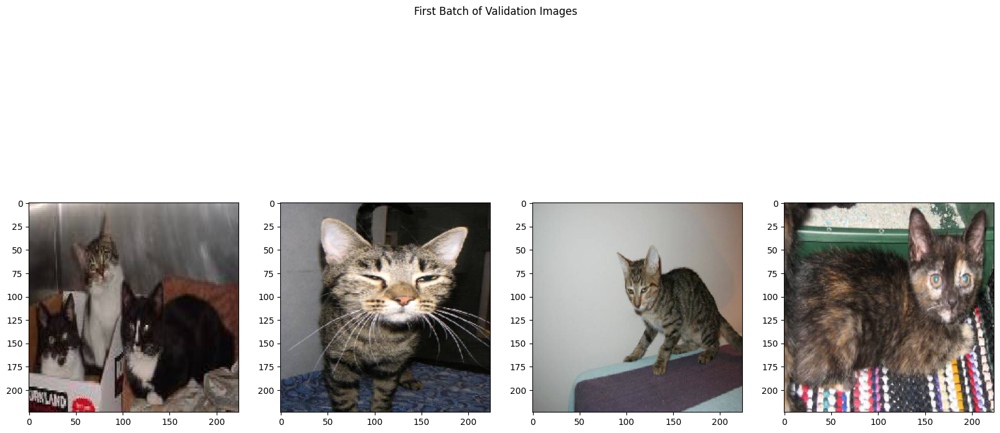

In [43]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 10))

ind = 0
for ax1 in axs: 
    image_data = first_batch[0][ind]
    ax1.imshow(image_data)
    ind += 1

fig.suptitle('First Batch of Validation Images') 
plt.show()

<br>

<h2 align=center id="compile_fit">Compile VGG-16 Model</h2>

<p><i>VGG-16</i> is a <i>convolution neural net (CNN)</i> architecture which was used to win <i>ILSVR (Imagenet)</i> competition in 2014. It is considered to be one of the excellent <i>vision model architecture</i> till date. In this section, we will start building our model. We will use the <i>Sequential model class</i> from <i>Keras</i>.</p></p>

<br>
<h3>Build VGG-16 Model</h3>

In [44]:
model_vgg16 = Sequential()

<p>Then, we will define our output layer as a <b>Dense</b> layer.</p>

In [45]:
model_vgg16.add(VGG16(include_top=False, pooling="avg", weights="imagenet"))
model_vgg16.add(Dense(64, activation='softmax', name = 'dense'))
model_vgg16.add(Dense(num_classes, activation="sigmoid", name = 'output'))

58889256/58889256 [==============================] - 0s 0us/step


In [46]:
model_vgg16.layers[0].trainable = False

<p>You can access the model's layers using the <i>layers</i> attribute of our model object.</p>

In [47]:
model_vgg16.layers

<p>And now using the <i>summary</i> attribute of the model.</p>

In [48]:
model_vgg16.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 dense (Dense)               (None, 64)                32832     
                                                                 
 output (Dense)              (None, 1)                 65        
                                                                 
Total params: 14,747,585
Trainable params: 32,897
Non-trainable params: 14,714,688
_________________________________________________________________


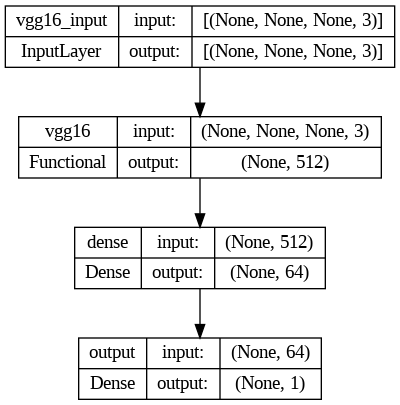

In [49]:
plot_model(model_vgg16, to_file='model_vgg16.png', show_shapes=True, show_layer_names=True)

<br>
<h3>Compile the Model</h3>

<p>Next, we compile our model using the <b>adam</b> optimizer.</p>

In [50]:
model_vgg16.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

<br>

<h2 align=center id="train_model">Train the VGG16 Model</h2>

<br>
<h3>Define Callback</h3>

<a name="4-1-1"></a>
#### [TensorBoard](https://www.tensorflow.org/tensorboard?hl=tr)

TensorBoard is a tool for providing the measurements and visualizations needed during the machine learning workflow. It enables tracking experiment metrics like loss and accuracy, visualizing the model graph, projecting embeddings to a lower dimensional space, and much more. 

<br>

<a name="4-1-2"></a>
#### [CSVLogger](https://keras.io/api/callbacks/csv_logger/)

Callback that streams epoch results to a CSV file.

<br>

<a name="4-1-3"></a>
#### [ModelCheckpoint](https://keras.io/api/callbacks/model_checkpoint/)

ModelCheckpoint callback is used in conjunction with training using <code>model.fit()</code> to save a model or weights (in a checkpoint file) at some interval, so the model or weights can be loaded later to continue the training from the state saved.

In [51]:
get_ipython().system('rm -rf logs')

In [52]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir)

In [53]:
csv_file = 'training.csv'

In [54]:
callbacks_list = [tensorboard_callback, CSVLogger(csv_file), ModelCheckpoint('/content/' + 'best_model.h5', verbose=1)]

<br>
<h3>Fit the Model</h3>

In [55]:
import time
start = time.time()

history = model_vgg16.fit(train_generator, 
                    epochs=num_epochs,
                    validation_data=validation_generator,
                    callbacks=[callbacks_list])

end = time.time()

elapsed_time = end - start

print(f"Elapsed Time:{elapsed_time}s")

Epoch 1/8
125/125 [==============================] - ETA: 0s - loss: 0.6844 - accuracy: 0.6064
Epoch 1: saving model to /content/best_model.h5
125/125 [==============================] - 781s 6s/step - loss: 0.6844 - accuracy: 0.6064 - val_loss: 0.6689 - val_accuracy: 0.8057
Epoch 2/8
125/125 [==============================] - ETA: 0s - loss: 0.6371 - accuracy: 0.8042
Epoch 2: saving model to /content/best_model.h5
125/125 [==============================] - 737s 6s/step - loss: 0.6371 - accuracy: 0.8042 - val_loss: 0.6102 - val_accuracy: 0.8163
Epoch 3/8
125/125 [==============================] - ETA: 0s - loss: 0.5811 - accuracy: 0.8484
Epoch 3: saving model to /content/best_model.h5
125/125 [==============================] - 738s 6s/step - loss: 0.5811 - accuracy: 0.8484 - val_loss: 0.5715 - val_accuracy: 0.8516
Epoch 4/8
125/125 [==============================] - ETA: 0s - loss: 0.5366 - accuracy: 0.8705
Epoch 4: saving model to /content/best_model.h5
125/125 [=======================

<br>
<h3>Save the Model</h3>

In [56]:
model_vgg16.save('/content/')

<br>

<h2 align=center id="evaluate_model">Evaluate the VGG16 Model</h2>

<p>Evaluating a CNN model is a crucial step in the development of a deep learning project. It helps in understanding how well the model performs on unseen data and provides insights into whether the model is overfitting or underfitting. Evaluation of the CNN model is important for the following reasons:</p>

<br>

<ol>
  <li><b>Performance measurement:</b> Evaluating a model helps in measuring its performance on the test data. This gives an idea of how well the model has learned to generalize to new data.</li>

  <li><b>Model selection:</b> Evaluation of different models can help in selecting the best model among them. It is essential to choose the model with the best performance metrics to deploy it in a production environment.</li>

  <li><b>Hyperparameter tuning:</b> Evaluating a model can also help in fine-tuning the hyperparameters of the model. By comparing the performance of models with different hyperparameters, we can identify the optimal hyperparameters that produce the best performance.</li>

  <li><b>Debugging:</b> Evaluation helps in identifying and diagnosing issues in the model. It can help in determining whether the model is overfitting or underfitting, which can be addressed by adjusting the architecture or hyperparameters.</li>
</ol>

<br>
<h3>Evaluate the Model with TensorBoard</h3>

In [57]:
%load_ext tensorboard

In [58]:
get_ipython().run_line_magic('tensorboard', '--logdir logs')

<IPython.core.display.Javascript object>

In [ ]:
# from tensorflow.keras.models import load_model
# model = load_model('/content/best_model.h5')

<br>
<h3>Calculate Model Loss and Accuracy</h3>

<p>Evaluate the model on the test set.</p>

In [97]:
test_generator = datagen.flow_from_directory(
  test_path,
  target_size=image_resize,
  batch_size=batch_size_test,
  class_mode='binary',
  shuffle=False,
)

Found 144 images belonging to 2 classes.


In [100]:
test_loss, test_acc = model_vgg16.evaluate(test_generator)
print('loss ', test_loss, 'test accuracy ', test_acc)

72/72 [==============================] - 77s 1s/step - loss: 0.4177 - accuracy: 0.8750
loss  0.417667031288147 test accuracy  0.875


<br>
<h3>Predict Test Images and Show Them on DataFrame</h3>

In [103]:
filenames=test_generator.filenames
pred=model_vgg16.predict_generator(test_generator, steps=len(test_generator), verbose=1).round(3)

72/72 [==============================] - 94s 1s/step


In [126]:
filenames_df = pd.DataFrame(filenames, columns=['File Path'])
pred_df = pd.DataFrame(np.round(pred), columns=['Predicted Indice'])
model_predictions = pd.concat([filenames_df, pred_df], axis=1)
model_predictions

,File Path,Predicted Indice
0,cats/cat.4020.jpg,0.0
1,cats/cat.4037.jpg,0.0
2,cats/cat.4051.jpg,0.0
3,cats/cat.4056.jpg,0.0
4,cats/cat.4073.jpg,0.0
...,...,...
139,dogs/dog.4634.jpg,1.0
140,dogs/dog.4653.jpg,1.0
141,dogs/dog.4654.jpg,1.0
142,dogs/dog.4673.jpg,1.0


In [127]:
file_name='model_predictions.csv'
model_predictions.to_csv(file_name, sep=',', encoding='utf-8')

<br>
<h3>Confusion Matrix</h4>

<p>Get the predicted labels for the test set.</p>

In [112]:
y_pred = model_vgg16.predict(test_generator)

72/72 [==============================] - 88s 1s/step


In [113]:
y_pred = np.round(y_pred)

<p>Get the true labels for the test set.</p>

In [114]:
y_true = test_generator.classes

In [115]:
cm = confusion_matrix(y_true, y_pred)

In [116]:
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[72  0]
 [18 54]]


<br>
<h3>Compute the Classification Report</h3>

In [117]:
cr = classification_report(y_true, y_pred, target_names=validation_generator.class_indices.keys())

In [118]:
print("Classification Report:")
print(cr)

Classification Report:
              precision    recall  f1-score   support

        cats       0.80      1.00      0.89        72
        dogs       1.00      0.75      0.86        72

    accuracy                           0.88       144
   macro avg       0.90      0.88      0.87       144
weighted avg       0.90      0.88      0.87       144



<br>
<h3>Receiver Operating Characteristic (ROC) and the Area Under the Curve (AUC)</h3>

In [123]:
fpr, tpr, _ = roc_curve(y_true, y_pred)

In [124]:
roc_auc = auc(fpr, tpr)

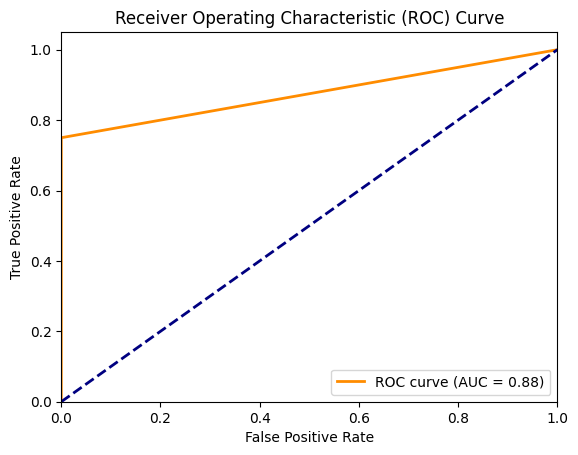

In [125]:
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

<br>

<h2 align=center id="upload_pred">Upload and Predict Your Picture!</h2>

<p>You can upload any image and have the model predict whether it's a dog or a cat.</p>
<ul>
  <li>Find an image of a dog or cat.</li>
  <li>Run the following code cell.  It will ask you to upload an image.</li>
  <li>The model will print "is a dog" or "is a cat" depending on the model's prediction.</li>
<ul>

In [119]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
 
  path = '/content/' + fn
  img = load_img(path, target_size=image_resize)
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model_vgg16.predict(image_tensor)

  print(classes)
  print(classes[0])
  if classes[0] > 0.5:
    print(fn + " is a dog")
  else:
    print(fn + " is a cat")

Saving dog.jpg to dog.jpg
1/1 [==============================] - 1s 685ms/step
[[0.7692928]]
[0.7692928]
dog.jpg is a dog


In [121]:
from google.colab import files
files.download('/content/variables/variables.data-00000-of-00001')
files.download('/content/variables/variables.index')
files.download('/content/best_model.h5')
files.download('/content/fingerprint.pb')
files.download('/content/keras_metadata.pb')
files.download('/content/saved_model.pb')
files.download('/content/training.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<h1>Contact Me</h1>
<p>If you have something to say to me please contact me:</p>

<ul>
  <li>Twitter: <a href="https://twitter.com/Doguilmak">Doguilmak</a></li>
  <li>Mail address: doguilmak@gmail.com</li>
</ul>

In [120]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2023-05-06 16:08:56
